In [1]:
import pandas as pd
from naive_bayes import NaiveBayes
from utils import tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary, getTrainingAndTestingData, plot_wordclouds_per_class, display_results_table
from modelUtils import run_model
from confusionMatrix import ConfusionMatrix

In [2]:
df_train = pd.read_csv("train.csv")
print(f"df_train.shape : {df_train.shape}")

print(df_train.head())

df_test = pd.read_csv("test.csv")
print(f"df_test.shape : {df_test.shape}")

print(df_test.head())

results = {}
vocabularyLengths = {}

df_train.shape : (140000, 3)
   label                              title  \
0      3                          Ernie Cox   
1     10                          Holosteum   
2      9                Pestarella tyrrhena   
3      1          MidSun Junior High School   
4      6  St James' Church Wrightington Bar   

                                             content  
0   Ernest Ernie Cox (February 17 1894 – February...  
1   Holosteum is a genus of plants in the Pink fa...  
2   Pestarella tyrrhena (formerly Callianassa tyr...  
3   MidSun Junior High School is a Canadian middl...  
4   St James' Church Wrightington Bar is in Churc...  
df_test.shape : (35000, 3)
   label                          title  \
0      4                   Lajos Drahos   
1      5          USS Huntsville (1857)   
2      0                         SCAFCO   
3      6               McLean's Mansion   
4      5  Avioane Craiova IAR-93 Vultur   

                                             content  
0   Lajos Drahos 

In [3]:
# Question Part 1 :: Unigram without stemming and removing stop words
# Train the model with title only corresponding to the labels
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "title", target_col = "Tokenized Title", remove_stop_words = False, with_stemming = False, window = [1])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "title", target_col = "Tokenized Title", remove_stop_words = False, with_stemming = False, window = [1])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Title")
    
# 1. unigram - without stem - without stop words - done
model = NaiveBayes()
modelName = "UNIGRAM-WITHOUT STEMMING-WITHOUT STOP WORDS REMOVAL"
print(f"--------{modelName}---------")
results[modelName] = run_model(model, vocabulary, trainingData, testingData, smoothening = 0.1, text_col = "Tokenized Title")

vocabularyLengths[modelName] = len(vocabulary)


Training Data Sample:
                           Tokenized Title  Class Index
0                             [ernie, cox]            3
1                              [holosteum]           10
2                   [pestarella, tyrrhena]            9
3           [midsun, junior, high, school]            1
4  [st, james', church, wrightington, bar]            6

Testing Data Sample:
                      Tokenized Title  Class Index
0                     [lajos, drahos]            4
1           [uss, huntsville, (1857)]            5
2                            [scafco]            0
3                 [mclean's, mansion]            6
4  [avioane, craiova, iar-93, vultur]            5
--------UNIGRAM-WITHOUT STEMMING-WITHOUT STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 120268
Shape of phi_y: (14,)
Shape of phi_j_given_y: (14, 120268)
Evaluating on train data...
Evaluating on 140000 examples
Overall Accuracy: 94.10%

Class 0 -> Precision: 0.9561, Recall: 0.9

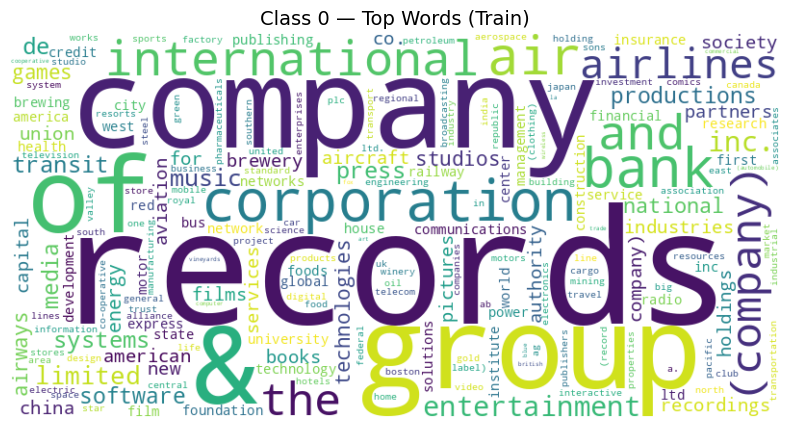

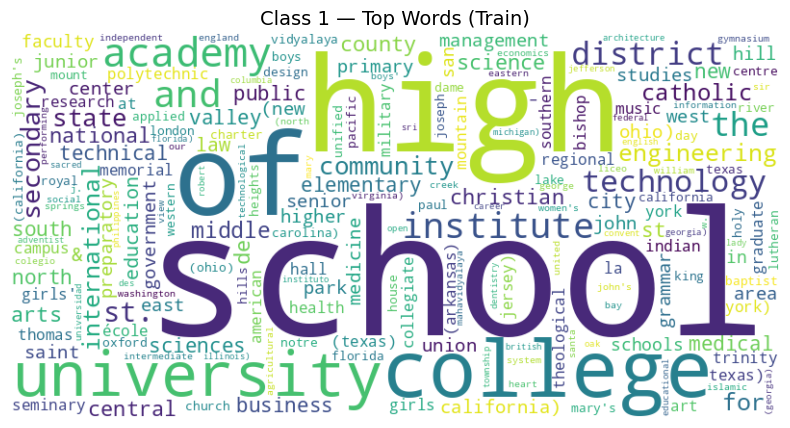

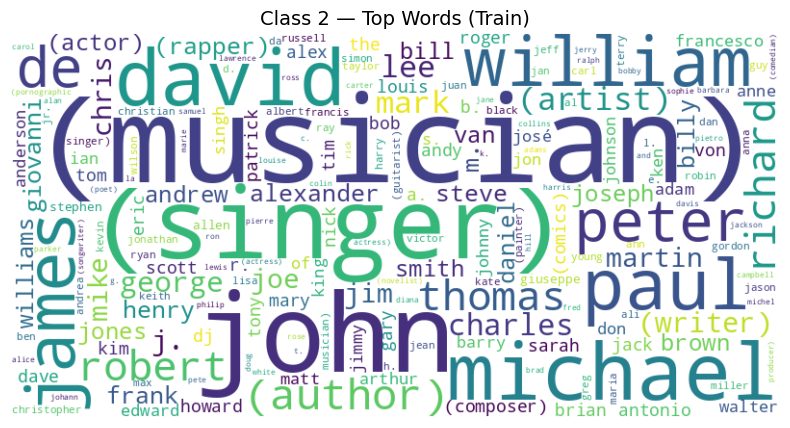

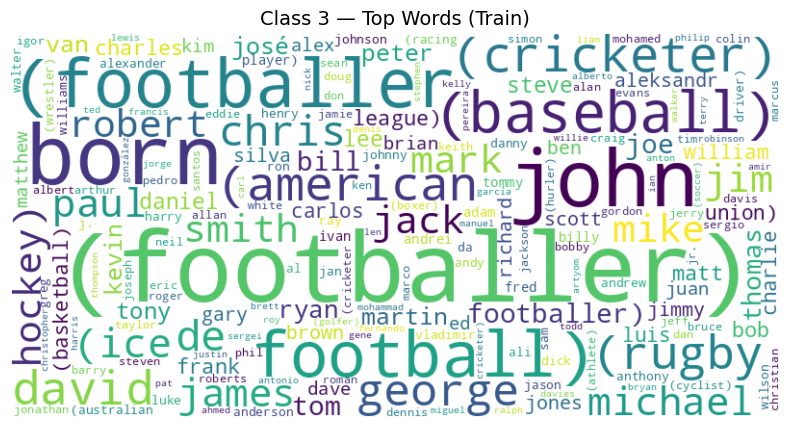

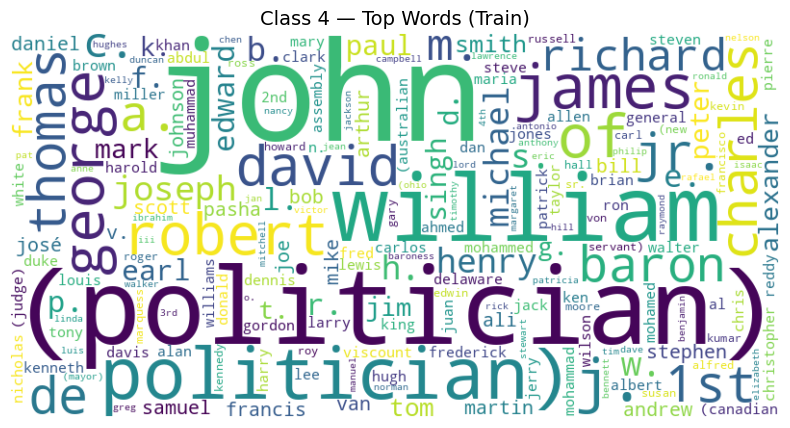

...

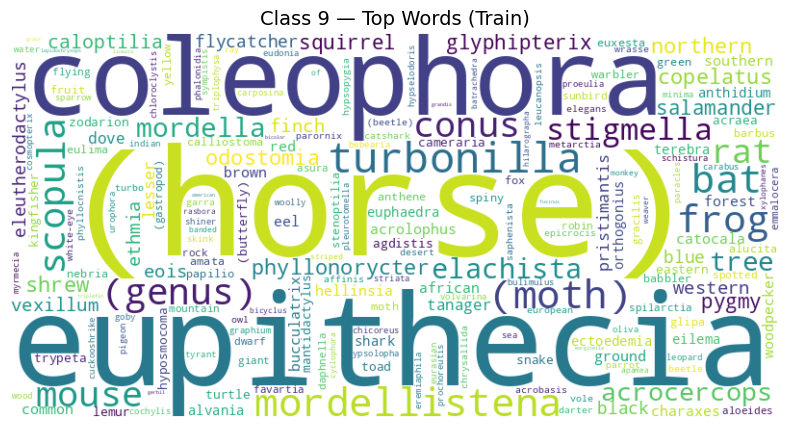

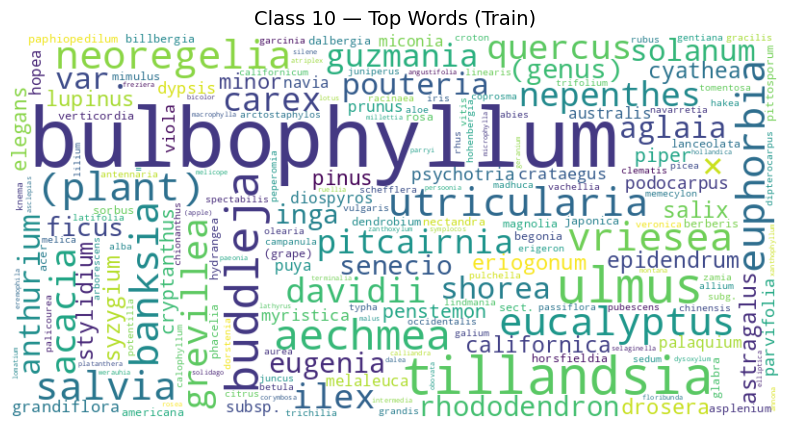

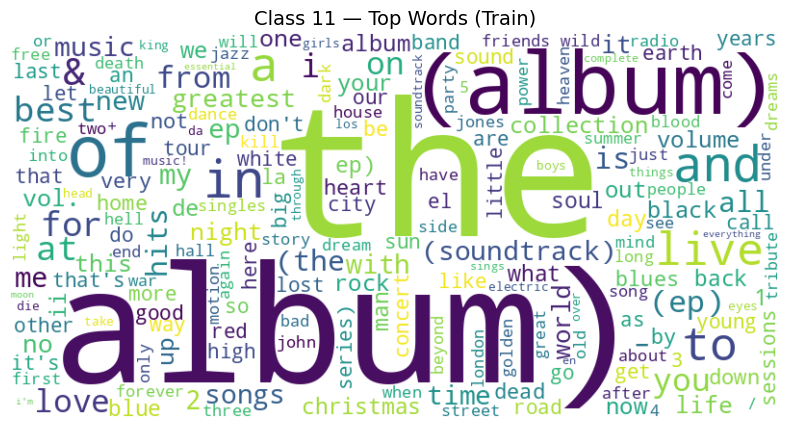

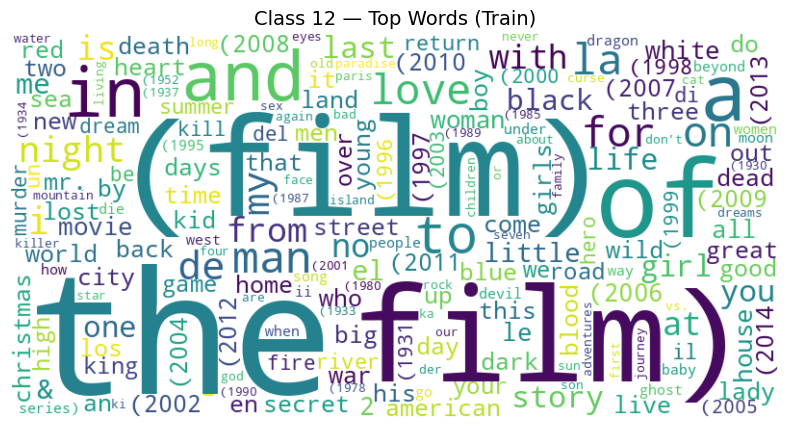

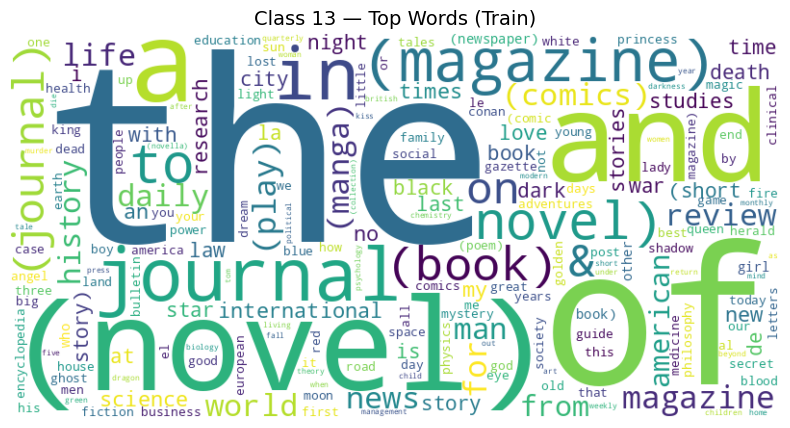

In [4]:
plot_wordclouds_per_class(trainingData, maxWords = 200, width = 800, height = 400, text_col = "Tokenized Title", saveToLocal = True, basePath = "wordCloudTitle")


Training Data Sample:
                           Tokenized Title  Class Index
0                              [erni, cox]            3
1                              [holosteum]           10
2                   [pestarella, tyrrhena]            9
3           [midsun, junior, high, school]            1
4  [st, james', church, wrightington, bar]            6

Testing Data Sample:
                     Tokenized Title  Class Index
0                      [lajo, draho]            4
1            [uss, huntsvil, (1857)]            5
2                           [scafco]            0
3                 [mclean', mansion]            6
4  [avioan, craiova, iar-93, vultur]            5
Word cloud on training data


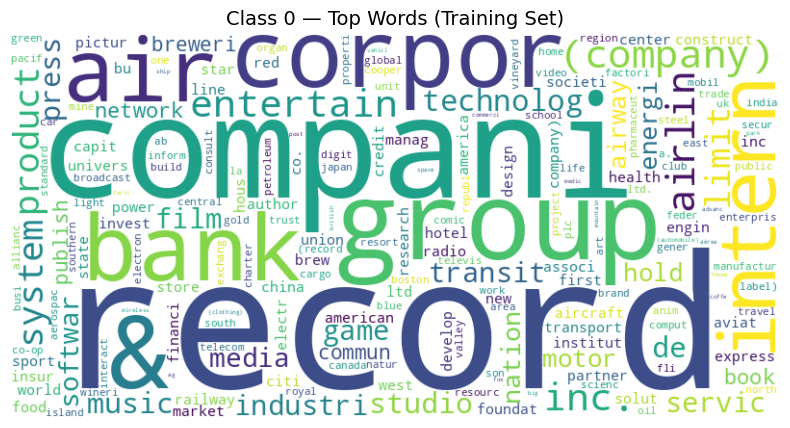

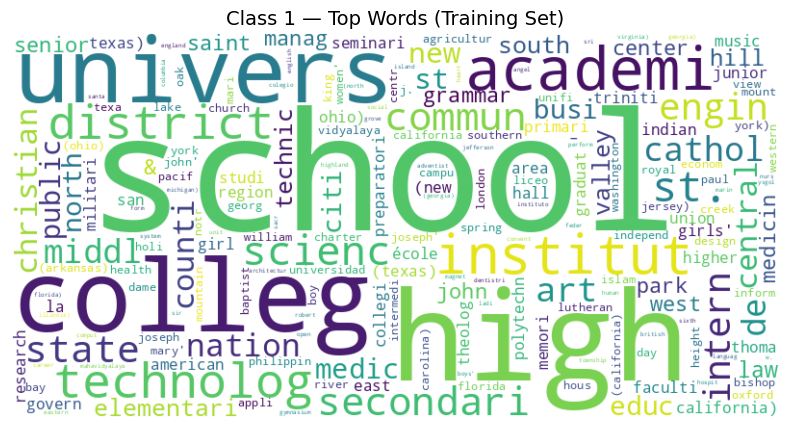

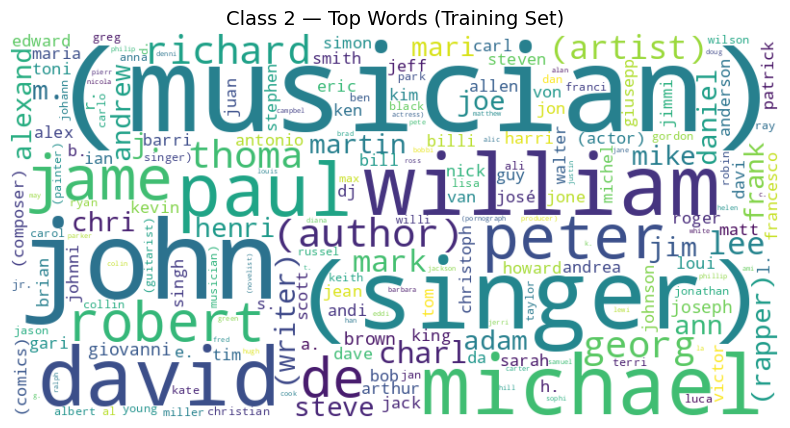

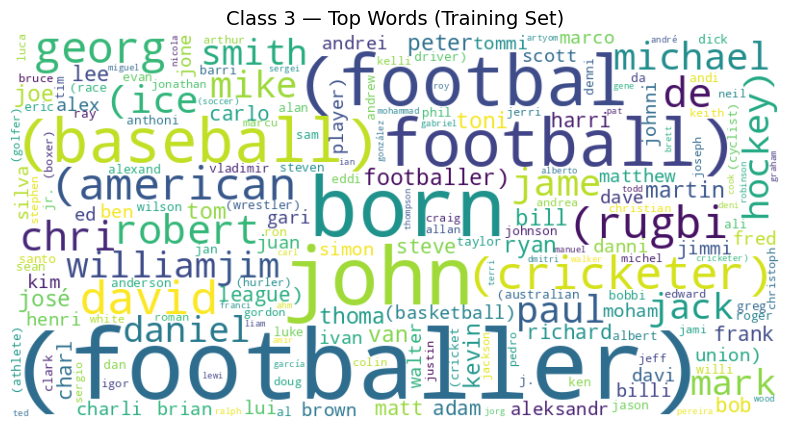

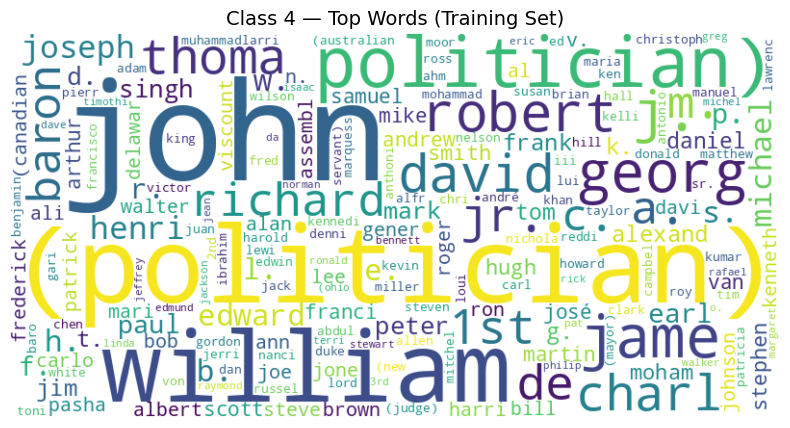

...

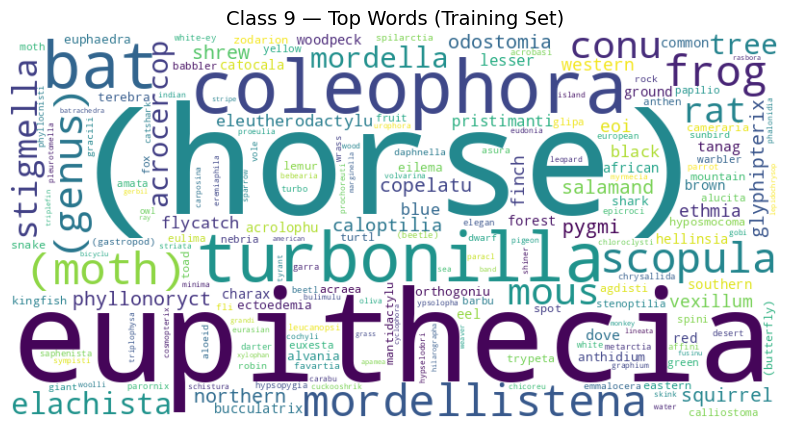

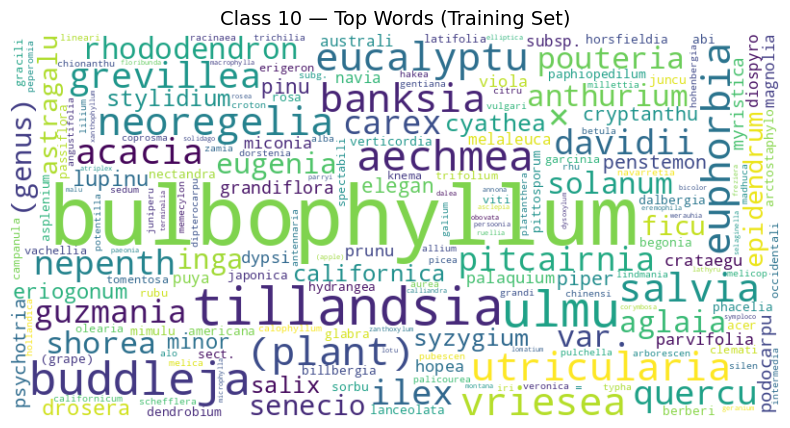

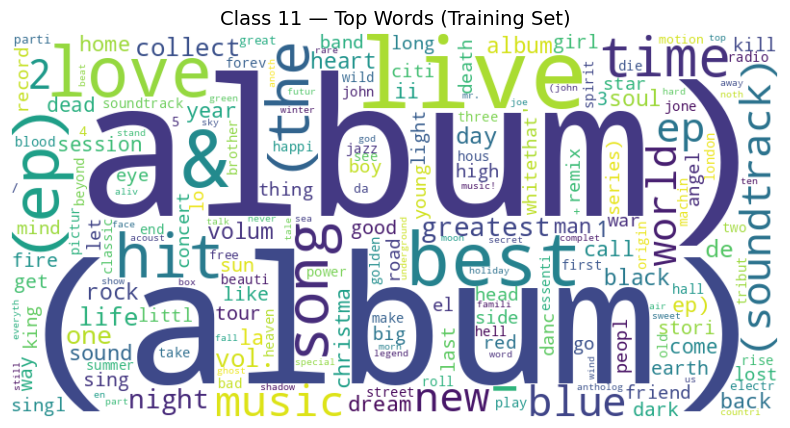

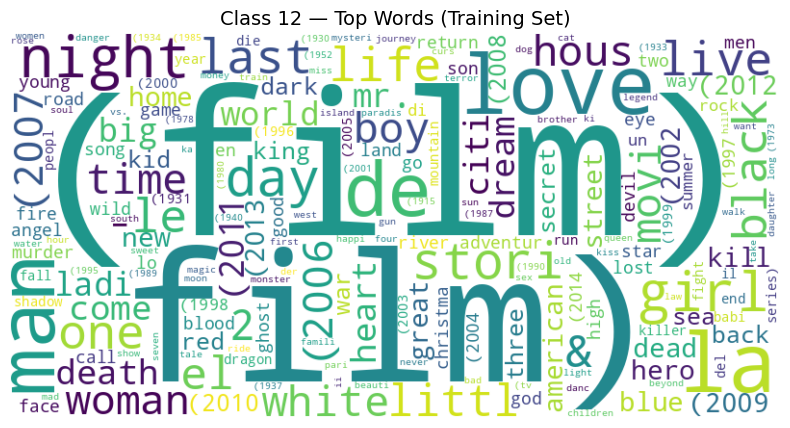

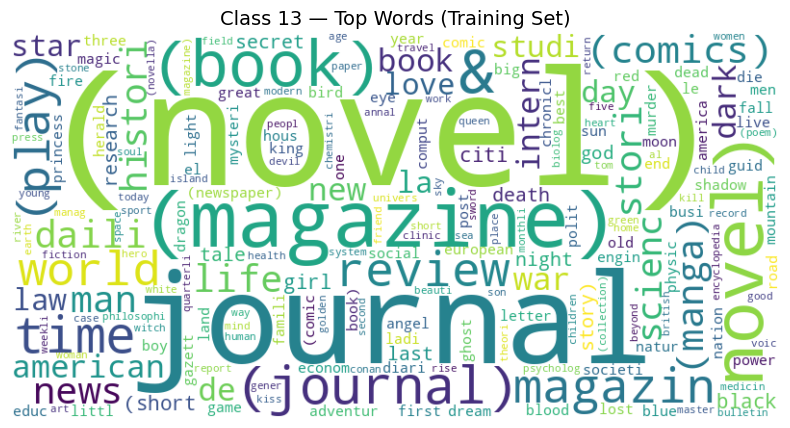

--------UNIGRAM-WITH STEMMING-WITH STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 113808
Shape of phi_y: (14,)
Shape of phi_j_given_y: (14, 113808)
Evaluating on train data...
Evaluating on 140000 examples
Overall Accuracy: 92.84%

Class 0 -> Precision: 0.9263, Recall: 0.9108, F1-Score: 0.9185
Class 1 -> Precision: 0.9437, Recall: 0.9842, F1-Score: 0.9635
Class 2 -> Precision: 0.8892, Recall: 0.8577, F1-Score: 0.8732
Class 3 -> Precision: 0.9066, Recall: 0.9015, F1-Score: 0.9040
Class 4 -> Precision: 0.8777, Recall: 0.9085, F1-Score: 0.8928
Class 5 -> Precision: 0.9707, Recall: 0.9710, F1-Score: 0.9709
Class 6 -> Precision: 0.9235, Recall: 0.9490, F1-Score: 0.9361
Class 7 -> Precision: 0.9765, Recall: 0.9815, F1-Score: 0.9790
Class 8 -> Precision: 0.9945, Recall: 0.9895, F1-Score: 0.9920
Class 9 -> Precision: 0.9945, Recall: 0.9855, F1-Score: 0.9900
Class 10 -> Precision: 0.9964, Recall: 0.9945, F1-Score: 0.9954
Class 11 -> Precision: 0.8636, Recall: 0

In [5]:
# Question 1, part 2 :: Unigram with stemming and removing stop words

# # (a) Perform stemming and remove the stop-words in the training as well as the validation data.
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "title", target_col = "Tokenized Title", remove_stop_words = True, with_stemming = True, window = [1])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "title", target_col = "Tokenized Title", remove_stop_words = True, with_stemming = True, window = [1])

# (c) Learn a new model on the transformed data. Report the validation set accuracy
# 2. unigram - with stem - with stop words       - done
trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Title")

# (b) Construct word clouds for both classes on the transformed data
print("Word cloud on training data")
plot_wordclouds_per_class(trainingData, data_type = "Training Set", maxWords = 200, width = 800, height = 400, text_col = "Tokenized Title", saveToLocal = True, basePath = "wordCloudTitle2")

model = NaiveBayes()
modelName = "UNIGRAM-WITH STEMMING-WITH STOP WORDS REMOVAL"
print(f"--------{modelName}---------")
results[modelName] = run_model(model, vocabulary, trainingData, testingData, smoothening = 0.1, text_col = "Tokenized Title")
vocabularyLengths[modelName] = len(vocabulary)
# 64

In [6]:
# Question 3 :: Bigram with stemming and removing stop words
# 3. bigram - with stem - with stop words        -done
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "title", target_col = "Tokenized Title", remove_stop_words = True, with_stemming = True, window = [2])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "title", target_col = "Tokenized Title", remove_stop_words = True, with_stemming = True, window = [2])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Title")

model = NaiveBayes()
print("--------BIGRAM -- WITH STEMMING -- WITH STOP WORDS REMOVAL---------")
modelName = "BIGRAM-WITH STEMMING-WITH STOP WORDS REMOVAL"
results[modelName] = run_model(model, vocabulary, trainingData, testingData, smoothening = 0.1, text_col = "Tokenized Title")

vocabularyLengths[modelName] = len(vocabulary)
# 25


Training Data Sample:
                                     Tokenized Title  Class Index
0                                         [erni cox]            3
1                                                 []           10
2                              [pestarella tyrrhena]            9
3          [midsun junior, junior high, high school]            1
4  [st james', james' church, church wrightington...            6

Testing Data Sample:
                                   Tokenized Title  Class Index
0                                     [lajo draho]            4
1                  [uss huntsvil, huntsvil (1857)]            5
2                                               []            0
3                                [mclean' mansion]            6
4  [avioan craiova, craiova iar-93, iar-93 vultur]            5
--------BIGRAM -- WITH STEMMING -- WITH STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 178478
Shape of phi_y: (14,)
Shape of phi_j_given_y: (

In [7]:
# Question 3 :: Bigram without stemming or removing stop words
# bigram - without stem - without stop words  - done
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "title", target_col = "Tokenized Title", remove_stop_words = False, with_stemming = False, window = [2])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "title", target_col = "Tokenized Title", remove_stop_words = False, with_stemming = False, window = [2])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Title")

model = NaiveBayes()
modelName = "BIGRAM-WITHOUT STEMMING-WITHOUT STOP WORDS REMOVAL"
print(f"--------{modelName}---------")
results[modelName] = run_model(model, vocabulary, trainingData, testingData, smoothening = 0.1, text_col = "Tokenized Title")

vocabularyLengths[modelName] = len(vocabulary)
# 28


Training Data Sample:
                                     Tokenized Title  Class Index
0                                        [ernie cox]            3
1                                                 []           10
2                              [pestarella tyrrhena]            9
3          [midsun junior, junior high, high school]            1
4  [st james', james' church, church wrightington...            6

Testing Data Sample:
                                    Tokenized Title  Class Index
0                                    [lajos drahos]            4
1               [uss huntsville, huntsville (1857)]            5
2                                                []            0
3                                [mclean's mansion]            6
4  [avioane craiova, craiova iar-93, iar-93 vultur]            5
--------BIGRAM-WITHOUT STEMMING-WITHOUT STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 189055
Shape of phi_y: (14,)
Shape of phi_j_give

In [8]:
# unigram - with stem - without stop words
# Question 4 :: uigram with stemming and removing stop words
# 4. uigram - with stem - with stop words        -done
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "title", target_col = "Tokenized Title", remove_stop_words = False, with_stemming = True, window = [1])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "title", target_col = "Tokenized Title", remove_stop_words = False, with_stemming = True, window = [1])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Title")

model = NaiveBayes()
modelName = "UNIGRAM-WITH STEMMING-WITHOUT STOP WORDS REMOVAL"
print("--------UNIGRAM -- WITH STEMMING -- WITHOUT STOP WORDS REMOVAL---------")
results[modelName] = run_model(model, vocabulary, trainingData, testingData, smoothening = 0.1, text_col = "Tokenized Title")
vocabularyLengths[modelName] = len(vocabulary)


Training Data Sample:
                           Tokenized Title  Class Index
0                              [erni, cox]            3
1                              [holosteum]           10
2                   [pestarella, tyrrhena]            9
3           [midsun, junior, high, school]            1
4  [st, james', church, wrightington, bar]            6

Testing Data Sample:
                     Tokenized Title  Class Index
0                      [lajo, draho]            4
1            [uss, huntsvil, (1857)]            5
2                           [scafco]            0
3                 [mclean', mansion]            6
4  [avioan, craiova, iar-93, vultur]            5
--------UNIGRAM -- WITH STEMMING -- WITHOUT STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 113916
Shape of phi_y: (14,)
Shape of phi_j_given_y: (14, 113916)
Evaluating on train data...
Evaluating on 140000 examples
Overall Accuracy: 93.11%

Class 0 -> Precision: 0.9405, Recall: 0.9107

In [9]:
# 4. unigram - without stem - with stop words
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "title", target_col = "Tokenized Title", remove_stop_words = True, with_stemming = False, window = [1])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "title", target_col = "Tokenized Title", remove_stop_words = True, with_stemming = False, window = [1])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Title")

model = NaiveBayes()
print("--------UNIGRAM -- WITHOUT STEMMING -- WITH STOP WORDS REMOVAL---------")
results["UNIGRAM-WITHOUT STEMMING-WITH STOP WORDS REMOVAL"] = run_model(model, vocabulary, trainingData, testingData, smoothening = 0.1, text_col = "Tokenized Title")


Training Data Sample:
                           Tokenized Title  Class Index
0                             [ernie, cox]            3
1                              [holosteum]           10
2                   [pestarella, tyrrhena]            9
3           [midsun, junior, high, school]            1
4  [st, james', church, wrightington, bar]            6

Testing Data Sample:
                      Tokenized Title  Class Index
0                     [lajos, drahos]            4
1           [uss, huntsville, (1857)]            5
2                            [scafco]            0
3                 [mclean's, mansion]            6
4  [avioane, craiova, iar-93, vultur]            5
--------UNIGRAM -- WITHOUT STEMMING -- WITH STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 120113
Shape of phi_y: (14,)
Shape of phi_j_given_y: (14, 120113)
Evaluating on train data...
Evaluating on 140000 examples
Overall Accuracy: 93.90%

Class 0 -> Precision: 0.9453, Recall: 

In [10]:
# 4. bigram - with stem - without stop words
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "title", target_col = "Tokenized Title", remove_stop_words = False, with_stemming = True, window = [2])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "title", target_col = "Tokenized Title", remove_stop_words = False, with_stemming = True, window = [2])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Title")

model = NaiveBayes()
print("--------BIGRAM -- WITH STEMMING -- WITHOUT STOP WORDS REMOVAL---------")
results["BIGRAM-WITH STEMMING-WITHOUT STOP WORDS REMOVAL"] = run_model(model, vocabulary, trainingData, testingData, smoothening = 0.1, text_col = "Tokenized Title")


Training Data Sample:
                                     Tokenized Title  Class Index
0                                         [erni cox]            3
1                                                 []           10
2                              [pestarella tyrrhena]            9
3          [midsun junior, junior high, high school]            1
4  [st james', james' church, church wrightington...            6

Testing Data Sample:
                                   Tokenized Title  Class Index
0                                     [lajo draho]            4
1                  [uss huntsvil, huntsvil (1857)]            5
2                                               []            0
3                                [mclean' mansion]            6
4  [avioan craiova, craiova iar-93, iar-93 vultur]            5
--------BIGRAM -- WITH STEMMING -- WITHOUT STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 187030
Shape of phi_y: (14,)
Shape of phi_j_given_y

In [11]:
# 4. bigram - without stem - with stop words
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "title", target_col = "Tokenized Title", remove_stop_words = True, with_stemming = False, window = [2])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "title", target_col = "Tokenized Title", remove_stop_words = True, with_stemming = False, window = [2])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Title")

model = NaiveBayes()
print("--------BIGRAM -- WITHOUT STEMMING -- WITH STOP WORDS REMOVAL---------")
results["BIGRAM-WITHOUT STEMMING-WITH STOP WORDS REMOVAL"] = run_model(model, vocabulary, trainingData, testingData, smoothening = 0.1, text_col = "Tokenized Title")


Training Data Sample:
                                     Tokenized Title  Class Index
0                                        [ernie cox]            3
1                                                 []           10
2                              [pestarella tyrrhena]            9
3          [midsun junior, junior high, high school]            1
4  [st james', james' church, church wrightington...            6

Testing Data Sample:
                                    Tokenized Title  Class Index
0                                    [lajos drahos]            4
1               [uss huntsville, huntsville (1857)]            5
2                                                []            0
3                                [mclean's mansion]            6
4  [avioane craiova, craiova iar-93, iar-93 vultur]            5
--------BIGRAM -- WITHOUT STEMMING -- WITH STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 179585
Shape of phi_y: (14,)
Shape of phi_j_g

In [12]:
# 4. bigram+unigram - without stem - without stop words
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "title", target_col = "Tokenized Title", remove_stop_words = False, with_stemming = False, window = [1,2])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "title", target_col = "Tokenized Title", remove_stop_words = False, with_stemming = False, window = [1,2])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Title")

model = NaiveBayes()
modelName = "BI+UNI+GRAM-WITHOUT STEMMING-WITHOUT STOP WORDS REMOVAL"
print("--------BI+UNI+GRAM -- WITHOUT STEMMING -- WITHOUT STOP WORDS REMOVAL---------")
results[modelName] = run_model(model, vocabulary, trainingData, testingData, smoothening = 0.1, text_col = "Tokenized Title")

vocabularyLengths[modelName] = len(vocabulary)


Training Data Sample:
                                     Tokenized Title  Class Index
0                            [ernie, cox, ernie cox]            3
1                                        [holosteum]           10
2        [pestarella, tyrrhena, pestarella tyrrhena]            9
3  [midsun, junior, high, school, midsun junior, ...            1
4  [st, james', church, wrightington, bar, st jam...            6

Testing Data Sample:
                                     Tokenized Title  Class Index
0                      [lajos, drahos, lajos drahos]            4
1  [uss, huntsville, (1857), uss huntsville, hunt...            5
2                                           [scafco]            0
3              [mclean's, mansion, mclean's mansion]            6
4  [avioane, craiova, iar-93, vultur, avioane cra...            5
--------BI+UNI+GRAM -- WITHOUT STEMMING -- WITHOUT STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 309323
Shape of phi_y: (14,)
Sh

In [13]:
# 4. bigram+unigram - with stem - with stop words
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "title", target_col = "Tokenized Title", remove_stop_words = True, with_stemming = True, window = [1,2])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "title", target_col = "Tokenized Title", remove_stop_words = True, with_stemming = True, window = [1,2])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Title")

model = NaiveBayes()
modelName = "BI+UNI+GRAM-WITH STEMMING-WITH STOP WORDS REMOVAL"
print("--------BI+UNI+GRAM -- WITH STEMMING -- WITH STOP WORDS REMOVAL---------")
results[modelName] = run_model(model, vocabulary, trainingData, testingData, smoothening = 0.1, text_col = "Tokenized Title")

vocabularyLengths[modelName] = len(vocabulary)


Training Data Sample:
                                     Tokenized Title  Class Index
0                              [erni, cox, erni cox]            3
1                                        [holosteum]           10
2        [pestarella, tyrrhena, pestarella tyrrhena]            9
3  [midsun, junior, high, school, midsun junior, ...            1
4  [st, james', church, wrightington, bar, st jam...            6

Testing Data Sample:
                                     Tokenized Title  Class Index
0                          [lajo, draho, lajo draho]            4
1  [uss, huntsvil, (1857), uss huntsvil, huntsvil...            5
2                                           [scafco]            0
3                [mclean', mansion, mclean' mansion]            6
4  [avioan, craiova, iar-93, vultur, avioan craio...            5
--------BI+UNI+GRAM -- WITH STEMMING -- WITH STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 292286
Shape of phi_y: (14,)
Shape of

In [14]:
display_results_table(results)


Model: UNIGRAM-WITHOUT STEMMING-WITHOUT STOP WORDS REMOVAL
╒══════════════════════╤═════════╤═════════╕
│ Metric               │   Train │    Test │
╞══════════════════════╪═════════╪═════════╡
│ Overall Accuracy (%) │ 94.1    │ 65.65   │
├──────────────────────┼─────────┼─────────┤
│ Overall Precision    │  0.941  │  0.6565 │
├──────────────────────┼─────────┼─────────┤
│ Overall Recall       │  0.941  │  0.6565 │
├──────────────────────┼─────────┼─────────┤
│ Overall F1 Score     │  0.941  │  0.6565 │
├──────────────────────┼─────────┼─────────┤
│ Macro F1 Score       │  0.9409 │  0.6698 │
╘══════════════════════╧═════════╧═════════╛

Model: UNIGRAM-WITH STEMMING-WITH STOP WORDS REMOVAL
╒══════════════════════╤═════════╤═════════╕
│ Metric               │   Train │    Test │
╞══════════════════════╪═════════╪═════════╡
│ Overall Accuracy (%) │ 92.84   │ 64.58   │
├──────────────────────┼─────────┼─────────┤
│ Overall Precision    │  0.9284 │  0.6458 │
├──────────────────────┼───────